In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
import matplotlib.pyplot as plt
import tensorflow as tf
import seaborn as sns
import random
from PIL import Image
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras import Sequential, Model
from keras.layers import (Conv2D, MaxPooling2D, Dense, Flatten, \
                          Dropout, Input,GlobalAveragePooling2D,BatchNormalization)
from tensorflow.keras.activations import softmax
from tensorflow.keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator
from mpl_toolkits.axes_grid1 import ImageGrid
from keras.models import Model
from keras.applications.vgg16 import VGG16, preprocess_input
from keras.callbacks import ModelCheckpoint, EarlyStopping
from sklearn.metrics import (ConfusionMatrixDisplay, confusion_matrix, \
                             accuracy_score)
import cv2

In [3]:
our_folders = ['Acne and Rosacea Photos', \
              'Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions', \
              'Melanoma Skin Cancer Nevi and Moles', \
               'Psoriasis pictures Lichen Planus and related diseases', \
               'Eczema Photos', \
               'Tinea Ringworm Candidiasis and other Fungal Infections', \
               'Seborrheic Keratoses and other Benign Tumors', \
              'Nail Fungus and other Nail Disease', \
              'Warts Molluscum and other Viral Infections', \
              'Systemic Disease']

In [4]:
root_dir = '../input/dermnet/train'

In [5]:
test_dir = '../input/dermnet/test'

In [6]:
acne_train_path = os.path.join(root_dir,'Acne and Rosacea Photos')
actinic_train_path = os.path.join(root_dir, 'Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions')
melonama_train_path = os.path.join(root_dir, 'Melanoma Skin Cancer Nevi and Moles')
psoriasis_train_path = os.path.join(root_dir,'Psoriasis pictures Lichen Planus and related diseases')
eczema_train_path = os.path.join(root_dir,'Eczema Photos')
tinea_train_path = os.path.join(root_dir,'Tinea Ringworm Candidiasis and other Fungal Infections')
seborrheic_train_path = os.path.join(root_dir,'Seborrheic Keratoses and other Benign Tumors')
nail_train_path = os.path.join(root_dir,'Nail Fungus and other Nail Disease')
warts_train_path = os.path.join(root_dir,'Warts Molluscum and other Viral Infections')
systemic_train_path = os.path.join(root_dir,'Systemic Disease')


In [7]:
acne_test_path = os.path.join(test_dir,'Acne and Rosacea Photos')
actinic_test_path = os.path.join(test_dir, 'Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions')
melonama_test_path = os.path.join(test_dir, 'Melanoma Skin Cancer Nevi and Moles')
psoriasis_test_path = os.path.join(test_dir,'Psoriasis pictures Lichen Planus and related diseases')
eczema_test_path = os.path.join(test_dir,'Eczema Photos')
tinea_test_path = os.path.join(test_dir,'Tinea Ringworm Candidiasis and other Fungal Infections')
seborrheic_test_path = os.path.join(test_dir,'Seborrheic Keratoses and other Benign Tumors')
nail_test_path = os.path.join(test_dir,'Nail Fungus and other Nail Disease')
warts_test_path = os.path.join(test_dir,'Warts Molluscum and other Viral Infections')
systemic_test_path = os.path.join(test_dir,'Systemic Disease')


actinic_test_files = ([files_ for _, _, files_ in os.walk(actinic_test_path)])[0]
acne_test_files = ([files_ for _, _, files_ in os.walk(acne_test_path)])[0]
psoriasis_test_files = ([files_ for _, _, files_ in os.walk(psoriasis_test_path)])[0]
melonama_test_files = ([files_ for _, _, files_ in os.walk(melonama_test_path)])[0]
eczema_test_files = ([files_ for _, _, files_ in os.walk(eczema_test_path)])[0]
tinea_test_files = ([files_ for _, _, files_ in os.walk(tinea_test_path)])[0]
seborrheic_test_files = ([files_ for _, _, files_ in os.walk(seborrheic_test_path)])[0]
nail_test_files = ([files_ for _, _, files_ in os.walk(nail_test_path)])[0]
warts_test_files = ([files_ for _, _, files_ in os.walk(warts_test_path)])[0]
systemic_test_files = ([files_ for _, _, files_ in os.walk(systemic_test_path)])[0]

In [8]:
train_dirs = []
for i in our_folders:
    for folder_,_, files_ in os.walk(f'../input/dermnet/train/{i}'):
        print(folder_)
        train_dirs.append(folder_)

../input/dermnet/train/Acne and Rosacea Photos
../input/dermnet/train/Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions
../input/dermnet/train/Melanoma Skin Cancer Nevi and Moles
../input/dermnet/train/Psoriasis pictures Lichen Planus and related diseases
../input/dermnet/train/Eczema Photos
../input/dermnet/train/Tinea Ringworm Candidiasis and other Fungal Infections
../input/dermnet/train/Seborrheic Keratoses and other Benign Tumors
../input/dermnet/train/Nail Fungus and other Nail Disease
../input/dermnet/train/Warts Molluscum and other Viral Infections
../input/dermnet/train/Systemic Disease


In [9]:
actinic_train_files = ([files_ for _, _, files_ in os.walk(actinic_train_path)])[0]

In [10]:
acne_train_files = ([files_ for _, _, files_ in os.walk(acne_train_path)])[0]

In [11]:
melonama_train_files = ([files_ for _, _, files_ in os.walk(melonama_train_path)])[0]

In [12]:
psoriasis_train_files = ([files_ for _, _, files_ in os.walk(psoriasis_train_path)])[0]

In [13]:
eczema_train_files = ([files_ for _, _, files_ in os.walk(eczema_train_path)])[0]

In [14]:
nail_train_files = ([files_ for _, _, files_ in os.walk(nail_train_path)])[0]

In [15]:
seborrheic_train_files = ([files_ for _, _, files_ in os.walk(seborrheic_train_path)])[0]

In [16]:
tinea_train_files = ([files_ for _, _, files_ in os.walk(tinea_train_path)])[0]

In [17]:
warts_train_files = ([files_ for _, _, files_ in os.walk(warts_train_path)])[0]

In [18]:
systemic_train_files = ([files_ for _, _, files_ in os.walk(systemic_train_path)])[0]

In [19]:
def plotGridImages(d_name, list_files, train_path,nrows= 1, ncols=5):
    # for folder_name in our_folders:
    fig = plt.figure(1, figsize=(30, 30))
    grid = ImageGrid(fig, 111, nrows_ncols=(nrows, ncols), axes_pad=0.05)
    print(f"{d_name}")
    for i, img_id in enumerate(random.sample(list_files,ncols)):
        ax = grid[i]
        image_dir_path = os.path.join(train_path, img_id)
        img = image.load_img(image_dir_path, (224, 224))
        img = image.img_to_array(img)
        ax.imshow(img / 255.)
        ax.text(10, 200, 'LABEL: %s' % d_name, color='k', backgroundcolor='w',\
        alpha=0.8)
        ax.axis('off')
    # plt.tight_layout()
    plt.show()

Melonama


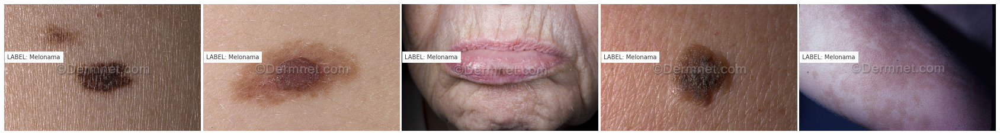

In [20]:
plotGridImages('Melonama',melonama_train_files, melonama_train_path,ncols=5)

Acne


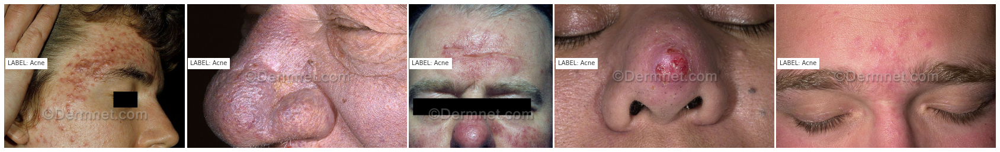

In [21]:
plotGridImages('Acne',acne_train_files, acne_train_path,ncols=5)

Actinic


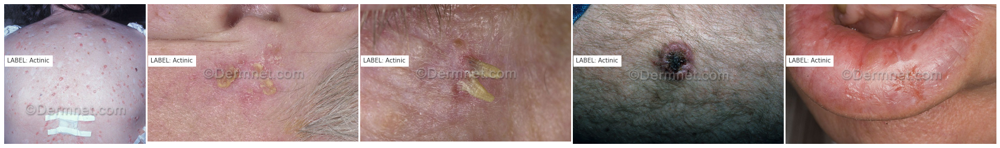

In [22]:
plotGridImages('Actinic',actinic_train_files, actinic_train_path,ncols=5)

Psoriasis


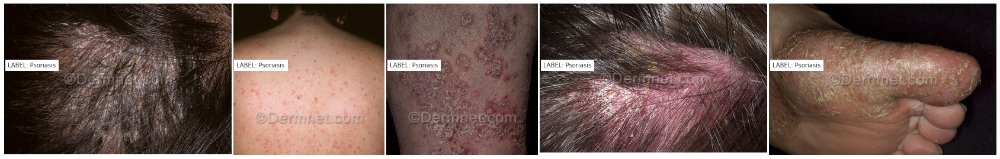

In [23]:
plotGridImages('Psoriasis',psoriasis_train_files, psoriasis_train_path,ncols=5)

Eczema


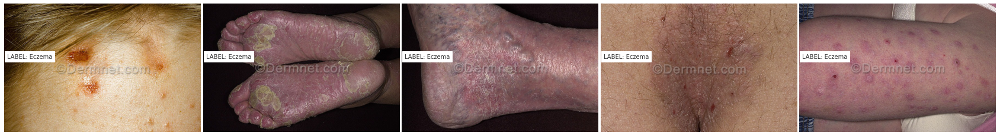

In [24]:
plotGridImages('Eczema',eczema_train_files, eczema_train_path,ncols=5)

Seborrheic


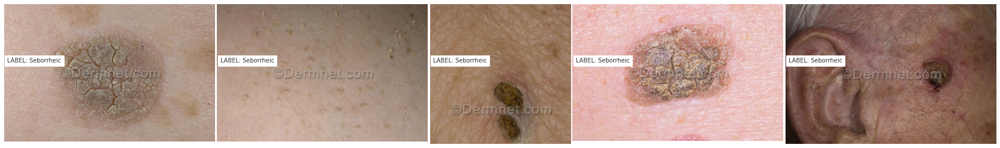

In [25]:
plotGridImages('Seborrheic',seborrheic_train_files, seborrheic_train_path,ncols=5)

Systemic


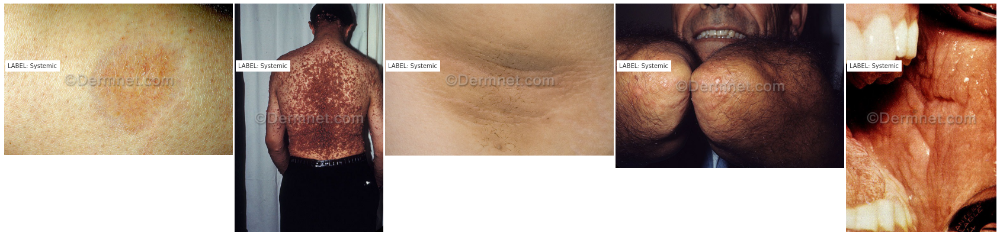

In [26]:
plotGridImages('Systemic',systemic_train_files, systemic_train_path,ncols=5)

Nail


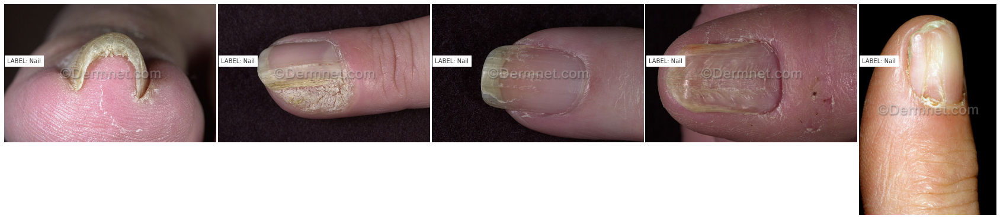

In [27]:
plotGridImages('Nail',nail_train_files, nail_train_path,ncols=5)

Tinea


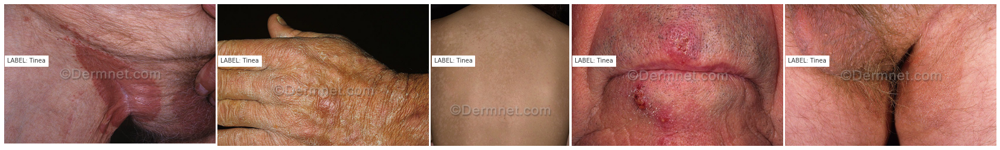

In [28]:
plotGridImages('Tinea',tinea_train_files, tinea_train_path,ncols=5)

Warts


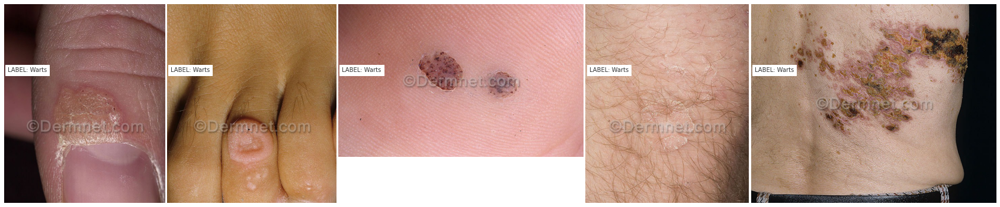

In [29]:
plotGridImages('Warts',warts_train_files, warts_train_path,ncols=5)

Actinic


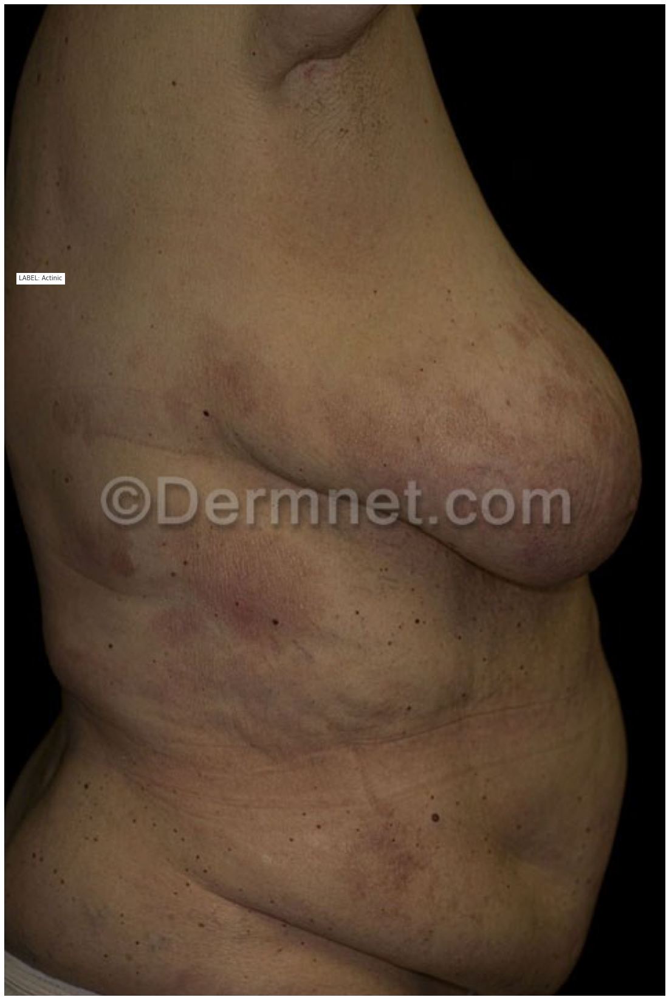

In [30]:
plotGridImages('Actinic',actinic_train_files, actinic_train_path,ncols=1)

In [31]:
final_df = pd.DataFrame()

In [32]:
melonama_df = pd.DataFrame()
melonama_df['Image'] = [melonama_train_path+'/'+img for img in melonama_train_files]
melonama_df['Label'] = "melonama"

In [33]:
melonama_df.shape

(463, 2)

In [34]:
actinic_df = pd.DataFrame()
actinic_df['Image'] =  [actinic_train_path+'/'+img for img in actinic_train_files]
actinic_df['Label'] = "actinic"

In [35]:
actinic_df.shape

(1149, 2)

In [36]:
acne_df = pd.DataFrame()
acne_df['Image'] =  [acne_train_path+'/'+img for img in acne_train_files]
acne_df['Label'] = "acne"

In [37]:
acne_df.shape

(840, 2)

In [38]:
nail_df = pd.DataFrame()
nail_df['Image'] =  [nail_train_path+'/'+img for img in nail_train_files]
nail_df['Label'] = "nail"
nail_df.shape

(1040, 2)

In [39]:
psoriasis_df = pd.DataFrame()
psoriasis_df['Image'] =  [psoriasis_train_path+'/'+img for img in psoriasis_train_files]
psoriasis_df['Label'] = "psoriasis"
psoriasis_df.shape

(1405, 2)

In [40]:
eczema_df = pd.DataFrame()
eczema_df['Image'] =  [eczema_train_path+'/'+img for img in eczema_train_files]
eczema_df['Label'] = "eczema"
eczema_df.shape

(1235, 2)

In [41]:
seborrheic_df = pd.DataFrame()
seborrheic_df['Image'] =  [seborrheic_train_path+'/'+img for img in seborrheic_train_files]
seborrheic_df['Label'] = "seborrheic"
seborrheic_df.shape

(1371, 2)

In [42]:
tinea_df = pd.DataFrame()
tinea_df['Image'] =  [tinea_train_path+'/'+img for img in tinea_train_files]
tinea_df['Label'] = "tinea"
tinea_df.shape

(1300, 2)

In [43]:
warts_df = pd.DataFrame()
warts_df['Image'] =  [warts_train_path+'/'+img for img in warts_train_files]
warts_df['Label'] = "warts"
warts_df.shape

(1086, 2)

In [44]:
systemic_df = pd.DataFrame()
systemic_df['Image'] =  [systemic_train_path+'/'+img for img in systemic_train_files]
systemic_df['Label'] = "systemic"
systemic_df.shape

(606, 2)

In [45]:
final_df = final_df.append([actinic_df, melonama_df, acne_df, nail_df, warts_df, seborrheic_df, psoriasis_df, tinea_df, eczema_df, systemic_df])

In [46]:
final_df.shape

(10495, 2)

In [47]:
final_df.sample(10)

,Image,Label
865,../input/dermnet/train/Nail Fungus and other N...,nail
1279,../input/dermnet/train/Tinea Ringworm Candidia...,tinea
795,../input/dermnet/train/Warts Molluscum and oth...,warts
182,../input/dermnet/train/Warts Molluscum and oth...,warts
253,../input/dermnet/train/Psoriasis pictures Lich...,psoriasis
741,../input/dermnet/train/Psoriasis pictures Lich...,psoriasis
806,../input/dermnet/train/Tinea Ringworm Candidia...,tinea
575,../input/dermnet/train/Seborrheic Keratoses an...,seborrheic
592,../input/dermnet/train/Seborrheic Keratoses an...,seborrheic
44,../input/dermnet/train/Tinea Ringworm Candidia...,tinea


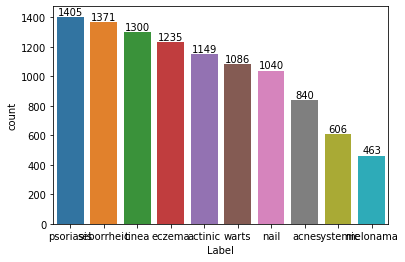

In [48]:
ax = sns.countplot(x=final_df['Label'],
                   order=final_df['Label'].value_counts(ascending=False).index);

abs_values = final_df['Label'].value_counts(ascending=False).values

ax.bar_label(container=ax.containers[0], labels=abs_values);

In [49]:
# Observation: Imabalnced dataset

In [50]:
final_test_df = pd.DataFrame()
################# melonama #########

melonama_test_df = pd.DataFrame()
melonama_test_df['Image'] = [melonama_test_path+'/'+img for img in melonama_test_files]
melonama_test_df['Label'] = "melonama"

##################  actinic  ##########

actinic_test_df = pd.DataFrame()
actinic_test_df['Image'] =  [actinic_test_path+'/'+img for img in actinic_test_files]
actinic_test_df['Label'] = "actinic"

################  acne  ##########

acne_test_df = pd.DataFrame()
acne_test_df['Image'] =  [acne_test_path+'/'+img for img in acne_test_files]
acne_test_df['Label'] = "acne"
###########################################
###########################################
nail_df = pd.DataFrame()
nail_df['Image'] =  [nail_train_path+'/'+img for img in nail_train_files]
nail_df['Label'] = "nail"
psoriasis_df = pd.DataFrame()
psoriasis_df['Image'] =  [psoriasis_train_path+'/'+img for img in psoriasis_train_files]
psoriasis_df['Label'] = "psoriasis"
eczema_df = pd.DataFrame()
eczema_df['Image'] =  [eczema_train_path+'/'+img for img in eczema_train_files]
eczema_df['Label'] = "eczema"
seborrheic_df = pd.DataFrame()
seborrheic_df['Image'] =  [seborrheic_train_path+'/'+img for img in seborrheic_train_files]
seborrheic_df['Label'] = "seborrheic"
tinea_df = pd.DataFrame()
tinea_df['Image'] =  [tinea_train_path+'/'+img for img in tinea_train_files]
tinea_df['Label'] = "tinea"
warts_df = pd.DataFrame()
warts_df['Image'] =  [warts_train_path+'/'+img for img in warts_train_files]
warts_df['Label'] = "warts"
systemic_df = pd.DataFrame()
systemic_df['Image'] =  [systemic_train_path+'/'+img for img in systemic_train_files]
systemic_df['Label'] = "systemic"
final_test_df = final_test_df.append([actinic_df, melonama_df, acne_df, nail_df, warts_df, seborrheic_df, psoriasis_df, tinea_df, eczema_df, systemic_df])

final_test_df.shape

(10495, 2)

In [51]:
# applying image augmentation techniques

In [52]:
train_data_gen  = ImageDataGenerator(
                                    rescale=1 / 255.0,
                                    rotation_range=40,
                                    width_shift_range=0.2,
                                    height_shift_range=0.2,
                                    horizontal_flip = True,
                                    vertical_flip = True,
                                    validation_split=0.2,
                                    fill_mode='nearest')
test_data_gen = ImageDataGenerator(rescale=1 / 255.0)

In [53]:
batch_size = 32
train_generator = train_data_gen.flow_from_dataframe(
    dataframe=final_df,
    x_col="Image",
    y_col="Label",
    target_size=(256, 256),
    batch_size=batch_size,
    class_mode="categorical",#sparse
    subset='training',
    shuffle=True,
    seed=42
)
valid_generator = train_data_gen.flow_from_dataframe(
    dataframe=final_df,
    x_col="Image",
    y_col="Label",
    target_size=(256, 256),
    batch_size=batch_size,
    class_mode="categorical", #sparse
    subset='validation',
    shuffle=True,
    seed=42 
)
test_generator = test_data_gen.flow_from_dataframe(
    dataframe=final_test_df,
    x_col="Image",
    y_col="Label",
    target_size=(256, 256),
    batch_size=1,
    class_mode='categorical',
    shuffle=False,
)

Found 8396 validated image filenames belonging to 10 classes.
Found 2099 validated image filenames belonging to 10 classes.
Found 10495 validated image filenames belonging to 10 classes.


In [54]:
# VGG16 with Input shape of our Images
# Include Top is set to false to allow us to add more layers

res = VGG16(weights ='imagenet', include_top = False, 
               input_shape = (64, 64, 3)) 
               
# Setting the trainable to false
res.trainable = False


x= res.output
x = GlobalAveragePooling2D()(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x) 
x = Dense(512, activation ='relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)

x = Dense(256, activation ='relu')(x)
x = BatchNormalization()(x)

x = Dense(10, activation ='softmax')(x)
model = Model(res.input, x)

model.compile(optimizer =tf.keras.optimizers.RMSprop(learning_rate=0.001),  #'Adam'
              loss ="categorical_crossentropy",  #sparse_categorical_crossentropy
              metrics =["categorical_accuracy"])#sparse_categorical_accuracy

num_epochs=30
model.summary()

58900480/58889256 [==============================] - 0s 0us/step
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 64, 64, 3)]       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 64, 64, 64)        1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 64, 64, 64)        36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 32, 32, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 32, 32, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 32, 32, 128)       147584    
______________________________________________________________

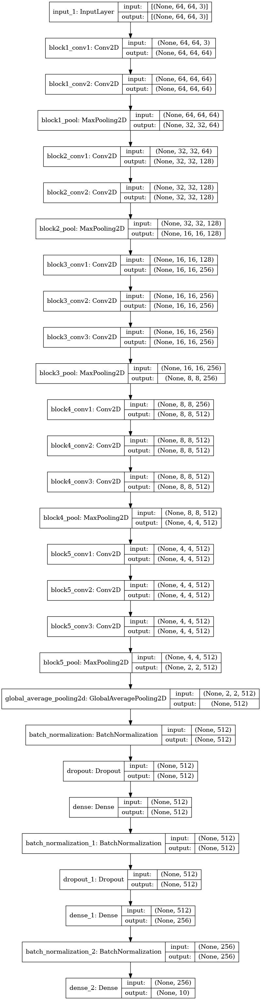

In [55]:
from keras.utils.vis_utils import plot_model
plot_model(model, show_shapes=True, show_layer_names=True)

In [56]:
#custom_early_stopping = EarlyStopping(
    #monitor='val_loss', 
  #  patience=10, 
    #min_delta=0.0001, 
    #mode='min'
#)

In [57]:
history = model.fit(train_generator, 
                    epochs=num_epochs, 
                    validation_data=valid_generator,
                   )

Epoch 1/30
263/263 [==============================] - 306s 1s/step - loss: 2.1212 - categorical_accuracy: 0.2807 - val_loss: 4.2005 - val_categorical_accuracy: 0.0057
Epoch 2/30
263/263 [==============================] - 227s 864ms/step - loss: 1.7981 - categorical_accuracy: 0.3324 - val_loss: 6.4164 - val_categorical_accuracy: 0.0114
Epoch 3/30
263/263 [==============================] - 225s 854ms/step - loss: 1.7358 - categorical_accuracy: 0.3553 - val_loss: 8.0203 - val_categorical_accuracy: 0.0467
Epoch 4/30
263/263 [==============================] - 226s 861ms/step - loss: 1.6946 - categorical_accuracy: 0.3685 - val_loss: 9.1326 - val_categorical_accuracy: 0.0510
Epoch 5/30
263/263 [==============================] - 228s 868ms/step - loss: 1.6837 - categorical_accuracy: 0.3697 - val_loss: 9.9757 - val_categorical_accuracy: 0.0276
Epoch 6/30
263/263 [==============================] - 227s 864ms/step - loss: 1.6623 - categorical_accuracy: 0.3759 - val_loss: 11.2507 - val_categorical

Accuracy plot

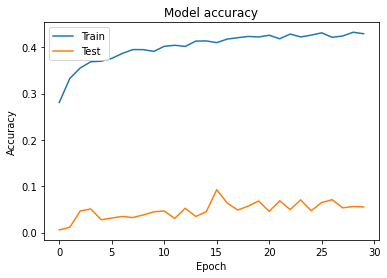

In [58]:
#plot accuracy vs epoch
plt.plot(history.history['categorical_accuracy']) #sparse_categorical_accuracy
plt.plot(history.history['val_categorical_accuracy']) #val_sparse_categorical_accuracy
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

Loss plot

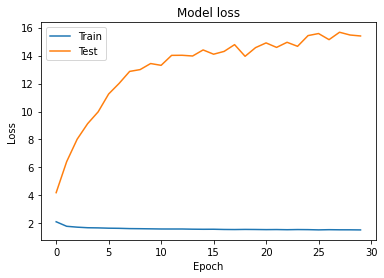

In [59]:
# Plot loss values vs epoch
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

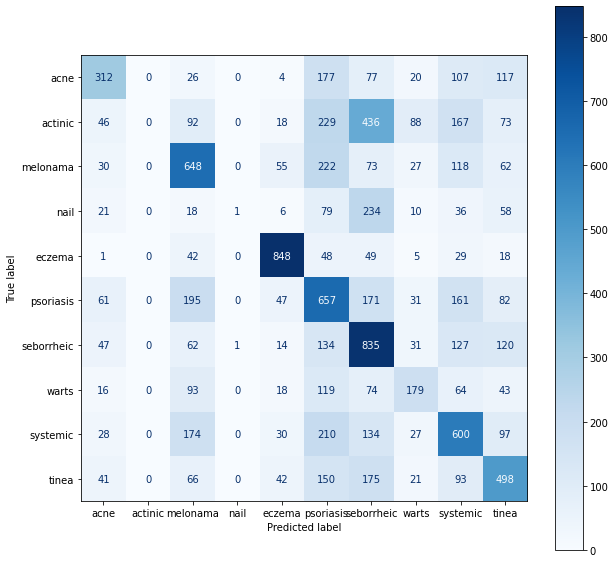

In [60]:
test_true=test_generator.classes
test_pred_raw = model.predict(test_generator)
test_pred = np.argmax(test_pred_raw, axis=1)

cm = confusion_matrix(test_true, test_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['acne','actinic','melonama','nail','eczema','psoriasis','seborrheic','warts','systemic','tinea'])
fig, ax = plt.subplots(figsize=(10,10))
disp.plot(ax=ax,cmap=plt.cm.Blues)
plt.show()

In [61]:
result = model.evaluate(test_generator,batch_size=32)
print("test_loss, test accuracy",result)

10495/10495 [==============================] - 142s 14ms/step - loss: 4.0692 - categorical_accuracy: 0.4362
test_loss, test accuracy [4.069222450256348, 0.43620771169662476]


In [62]:
vgg_preds = model.predict(test_generator)
vgg_pred_classes = np.argmax(vgg_preds, axis=1)

In [63]:
true_classes = test_generator.classes
class_indices = train_generator.class_indices
class_indices = dict((v,k) for k,v in class_indices.items())


vgg_acc = accuracy_score(true_classes, vgg_pred_classes)
print("VGG16 Model Accuracy: {:.2f}%".format(vgg_acc * 100))

VGG16 Model Accuracy: 43.62%


In [64]:
# Test dataset accuracy 